# Ablation Driver

Front end for the ablation scripts. Every training cell shells out to a separate
process with `!{sys.executable} script.py ...`, which matters for two reasons:

**GPU memory comes back.** A subprocess releases all of its VRAM when it exits.
If you `%run` these scripts or `import common`, TensorFlow loads into *this*
kernel and holds the GPU until you restart it, which is how idle kernels end up
squatting on a card.

**Resume survives a dead kernel.** Fold models and CSV rows are written as each
fold finishes. Interrupt a cell, restart the kernel, re-run the same cell, and it
picks up from the last completed fold.

Analysis cells are different — those run in this kernel so tables and plots
display inline. They only touch pandas and matplotlib, never TensorFlow.

Run order: **Setup → Tier 0 → smoke test → Stage 1 onward.**

## Setup

In [43]:
import os, sys, subprocess, glob
from pathlib import Path

# Point this at the folder holding your notebooks, so datasets/, saved_models/,
# saved_np/ and results/ resolve the same way they do for the notebooks.

# TODO: FIX FOR REPRODUCIBILITY
PROJECT_DIR  = Path("/home/kmal768")
ABLATION_DIR = Path("/home/kmal768/ablations")

DATASET = "ISIC2018"
GPU     = "0"            # CUDA_VISIBLE_DEVICES for the child process

os.chdir(PROJECT_DIR)
print("cwd:", Path.cwd())
print("python:", sys.executable)

missing = [f for f in ["common.py", "ssl_models.py", "pretrain.py", "finetune.py",
                       "tier0_tables.py", "tier0_sweep.py", "eval_pattern_patch.py",
                       "patch_eval_pipeline.py"]
           if not (ABLATION_DIR / f).exists()]
print("missing scripts:", missing or "none")
for d in ["datasets", "saved_models", "saved_np", "results"]:
    print(f"  {d}/", "exists" if (PROJECT_DIR / d).is_dir() else "MISSING")

cwd: /home/kmal768
python: /home/kmal768/miniconda3/bin/python
missing scripts: none
  datasets/ exists
  saved_models/ exists
  saved_np/ exists
  results/ exists


In [18]:
import os, sys, subprocess, glob
from pathlib import Path

# Point this at the folder holding your notebooks, so datasets/, saved_models/,
# saved_np/ and results/ resolve the same way they do for the notebooks.

# TODO: FIX FOR REPRODUCIBILITY
PROJECT_DIR  = Path("/home/kmal768")
ABLATION_DIR = Path("/home/kmal768/ablations")

DATASET = "KDSB"
GPU     = "0"            # CUDA_VISIBLE_DEVICES for the child process

os.chdir(PROJECT_DIR)
print("cwd:", Path.cwd())
print("python:", sys.executable)

missing = [f for f in ["common.py", "ssl_models.py", "pretrain.py", "finetune.py",
                       "tier0_tables.py", "tier0_sweep.py", "eval_pattern_patch.py",
                       "patch_eval_pipeline.py"]
           if not (ABLATION_DIR / f).exists()]
print("missing scripts:", missing or "none")
for d in ["datasets", "saved_models", "saved_np", "results"]:
    print(f"  {d}/", "exists" if (PROJECT_DIR / d).is_dir() else "MISSING")

cwd: /home/kmal768
python: /home/kmal768/miniconda3/bin/python
missing scripts: none
  datasets/ exists
  saved_models/ exists
  saved_np/ exists
  results/ exists


In [19]:
def run(script, *args, cwd=None):
    """Run one ablation script in its own process, streaming output into the cell.

    Uses sys.executable rather than a bare `python` so the child lands in the same
    environment as this kernel. A bare `!python` can pick up a different
    interpreter with no TensorFlow in it.
    """
    cmd = [sys.executable, "-u", str(ABLATION_DIR / script), *[str(a) for a in args]]
    print("$", " ".join(cmd), "\n", flush=True)
    proc = subprocess.Popen(cmd, cwd=str(cwd or PROJECT_DIR),
                            stdout=subprocess.PIPE, stderr=subprocess.STDOUT,
                            text=True, bufsize=1)
    try:
        for line in proc.stdout:
            print(line, end="")
        proc.wait()
    except KeyboardInterrupt:
        proc.terminate()
        proc.wait()
        print("\n[interrupted — rerun this cell to resume from the last completed fold]")
        return 130
    if proc.returncode:
        print(f"\n[exit {proc.returncode}]")
    return proc.returncode

In [20]:
# Confirm the filename parser handles both your existing files and the ablation names.
run("eval_pattern_patch.py")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/eval_pattern_patch.py 

ok    model_ISIC2018_BT-UNet_5pct_fold0.keras
ok    model_ISIC2018_BT-UNet_50pct_ensemble.keras
ok    model_ISIC2018_SimSiam-UNET_5pct_fold3.keras
ok    model_KDSB_UNet_20pct.keras
ok    model_UNet_10pct_fold1
ok    model_ISIC2018_BT-UNet_5pct_frozen_fold0.keras
ok    model_ISIC2018_BT-UNet_5pct_proj512_ensemble.keras
ok    model_ISIC2018_SimSiam-UNET_5pct_nostopgrad_fold2.keras
ok    model_ISIC2018_BT-UNet_1pct_aug0.25_fold4.keras
ok    model_KDSB_UNet_100pct_sslbudget-5_fold0.keras
ok    model_ISIC2018_BT-UNet_5pct_frozen.keras
ok    rejected notamodel.keras
ok    rejected model_ISIC2018_ResNet_5pct.keras
ok    rejected model_ISIC2018_BT-UNet.keras
ok    rejected readme.txt

0 failure(s)


0

## Optional: patch the evaluation pipeline

**This notebook does not use `Evaluation_Pipeline.ipynb`.** `finetune.py` scores
every model as it trains it and writes its own CSVs, so the ablations are
self-sufficient. Patch the evaluation pipeline only if you also want to re-score
everything — old runs and new — through one uniform pass at the end.

If you do: its `MODEL_PATTERN` allows nothing between `{pct}pct` and the
`_fold{i}` / `_ensemble` suffix, so every ablation filename fails to match, and
`discover_models` skips non-matching files without raising. The symptom is a short
results table, not an error.

The cell below writes `Evaluation_Pipeline_PATCHED.ipynb` beside the original and
changes nothing else. Open the patched copy from then on; keep the original.
Running the patcher twice is harmless — it applies 0 edits and exits 1.

In [21]:
# Find the evaluation pipeline notebook and patch it.
candidates = [p for p in PROJECT_DIR.glob("*.ipynb")
              if "evaluation" in p.name.lower() and "PATCHED" not in p.name]

if not candidates:
    print("No Evaluation_Pipeline notebook found in", PROJECT_DIR)
    print("Skip this cell if you are not using it, or set the path by hand:")
    print('    run("patch_eval_pipeline.py", "Evaluation_Pipeline.ipynb")')
elif len(candidates) > 1:
    print("More than one candidate; pass the one you want explicitly:")
    for c in candidates:
        print(f'    run("patch_eval_pipeline.py", "{c.name}")')
else:
    target = candidates[0]
    print(f"Patching {target.name}\n")
    run("patch_eval_pipeline.py", target.name)

No Evaluation_Pipeline notebook found in /home/kmal768
Skip this cell if you are not using it, or set the path by hand:
    run("patch_eval_pipeline.py", "Evaluation_Pipeline.ipynb")


## Tier 0 — free, no training

Run this before booking the GPU. `tier0_tables.py` needs nothing but the CSVs you
already have.

In [44]:
run("tier0_tables.py", "--results-dir", "results", "--out-dir", "results/tier0")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/tier0_tables.py --results-dir results --out-dir results/tier0 

Dropped 105 duplicate fold rows (same key in more than one CSV).
Dropped 21 duplicate ensemble rows (same key in more than one CSV).
Wrote:
  results/tier0/fold_summary.csv
  results/tier0/headline.csv
  results/tier0/collapse_rates.csv
  results/tier0/fold_scatter_ISIC2018_aug025.png
  results/tier0/fold_scatter_ISIC2018_aug100.png
  results/tier0/fold_scatter_ISIC2018_base.png
  results/tier0/fold_scatter_ISIC2018_bs32.png
  results/tier0/fold_scatter_ISIC2018_bs64.png
  results/tier0/fold_scatter_ISIC2018_cropflip.png
  results/tier0/fold_scatter_ISIC2018_e0.png
  results/tier0/fold_scatter_ISIC2018_e200.png
  results/tier0/fold_scatter_ISIC2018_e25.png
  results/tier0/fold_scatter_ISIC2018_e50.png
  results/tier0/fold_scatter_ISIC2018_frozen.png
  results/tier0/fold_scatter_ISIC2018_lambda0001.png
  results/tier0/fold_scatter_ISIC2018_lambda002.png
  resu

0

### Read the Tier 0 output inline

This cell runs in the kernel (pandas only, no TensorFlow) so the tables display
properly.

,Dataset,Model,Variant,Label Fraction (%),Folds run,Fold mean Test Dice,Fold std Test Dice,Fold median Test Dice,Collapsed folds,bimodal,Ensemble Test Dice (filtered),Folds combined (filtered),Ensemble Test Dice (unfiltered),Folds combined (unfiltered)
0,ISIC2018,BT-UNet,aug025,5,5,0.5915,0.0235,0.5912,0,False,0.6090,5.0000,0.6090,5
1,ISIC2018,BT-UNet,aug100,5,5,0.6459,0.1470,0.5541,0,False,0.6962,5.0000,0.6962,5
2,ISIC2018,BT-UNet,base,1,5,0.5511,0.0217,0.5390,0,False,0.5658,5.0000,0.5658,5
3,ISIC2018,BT-UNet,base,5,5,0.5690,0.0474,0.5574,0,False,0.5657,5.0000,0.5657,5
4,ISIC2018,BT-UNet,base,10,5,0.7495,0.1271,0.7950,0,False,0.8117,5.0000,0.8117,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,KDSB,SimSiam,proj2048,5,5,0.6611,0.0244,0.6736,0,False,0.6871,5.0000,0.6871,5
113,KDSB,SimSiam,proj256,5,5,0.6372,0.0211,0.6253,0,False,0.6563,5.0000,0.6563,5
114,KDSB,SimSiam,proj512,5,5,0.6089,0.1191,0.6384,0,False,0.7149,5.0000,0.7149,5
115,KDSB,SimSiam,sslbudget20,20,5,0.6189,0.0667,0.6376,0,False,0.6826,5.0000,0.6826,5



Cells where the recall floor removed folds. Any ensemble here was built
from a subset of its folds and is not comparable with a cell where none
were excluded — check Folds Combined before quoting these numbers.



,Dataset,Model,Variant,Label Fraction (%),n,collapsed,collapse_rate,bimodal
10,ISIC2018,BT-UNet,e0,5,5,5,1.0000,False
25,ISIC2018,BT-UNet,sslbudget5,5,5,5,1.0000,False
26,ISIC2018,Baseline,base,1,5,2,0.4000,True
27,ISIC2018,Baseline,base,5,5,3,0.6000,True
31,ISIC2018,Baseline,lossbce,5,5,4,0.8000,False
32,ISIC2018,Baseline,lossdice,5,5,2,0.4000,True
43,ISIC2018,SimSiam,e0,5,5,1,0.2000,True
84,KDSB,BT-UNet,sslbudget5,5,5,5,1.0000,False
85,KDSB,Baseline,base,1,5,1,0.2000,False
86,KDSB,Baseline,base,5,5,1,0.2000,True


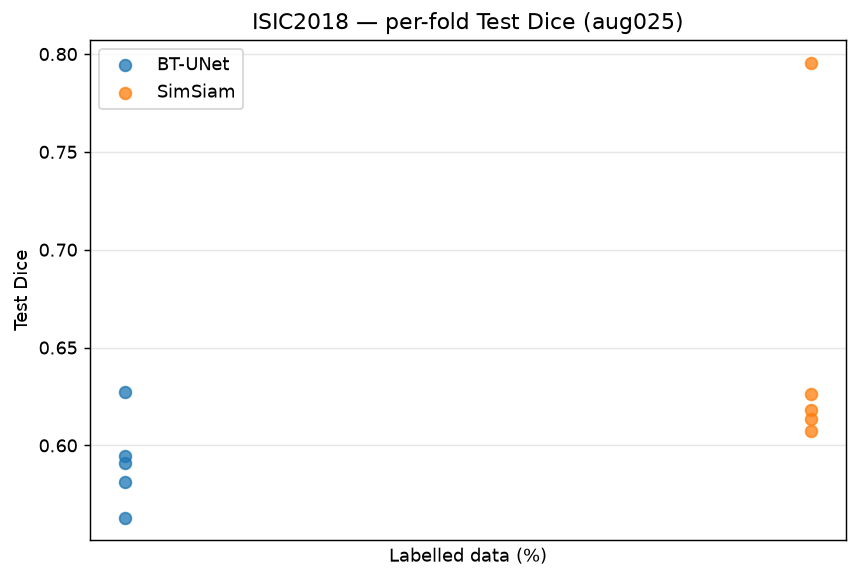

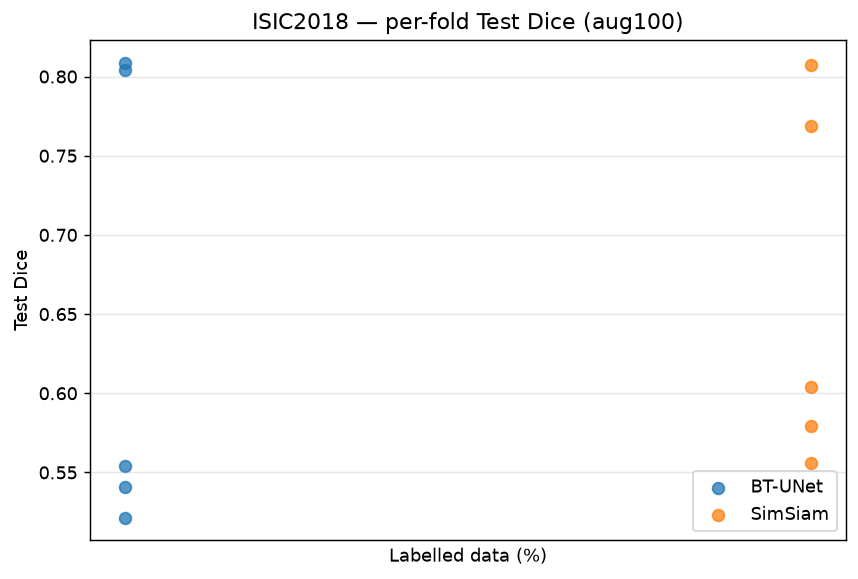

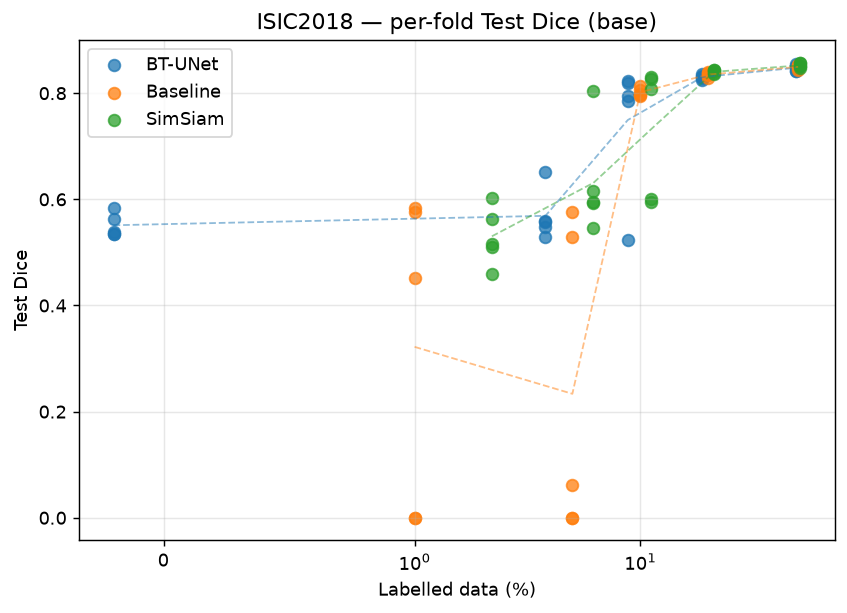

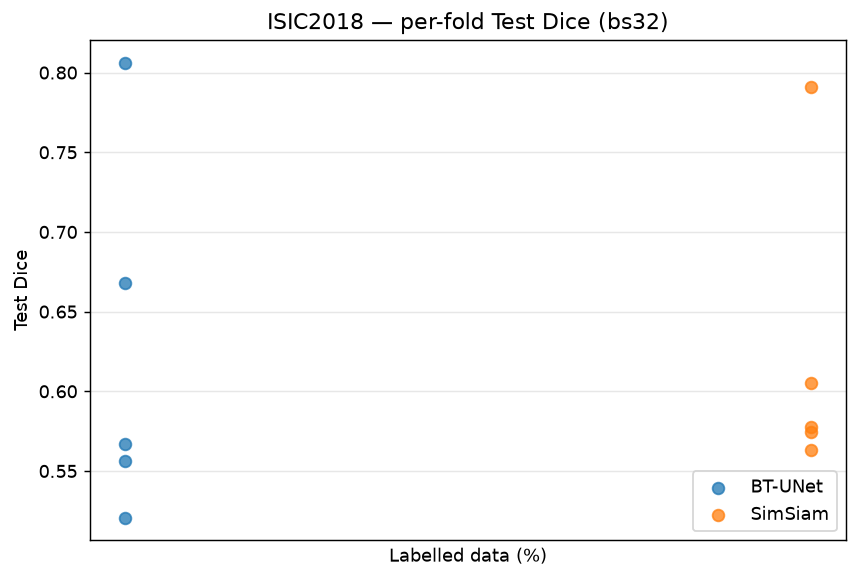

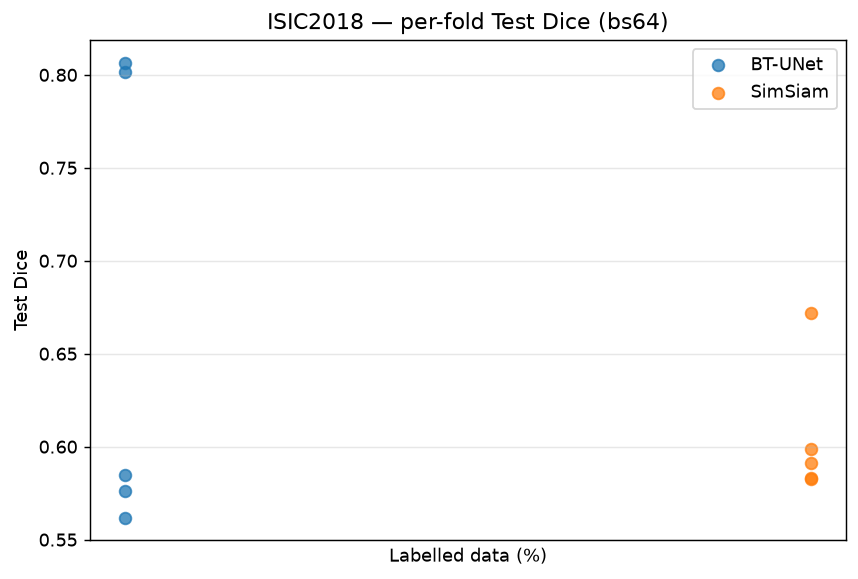

...

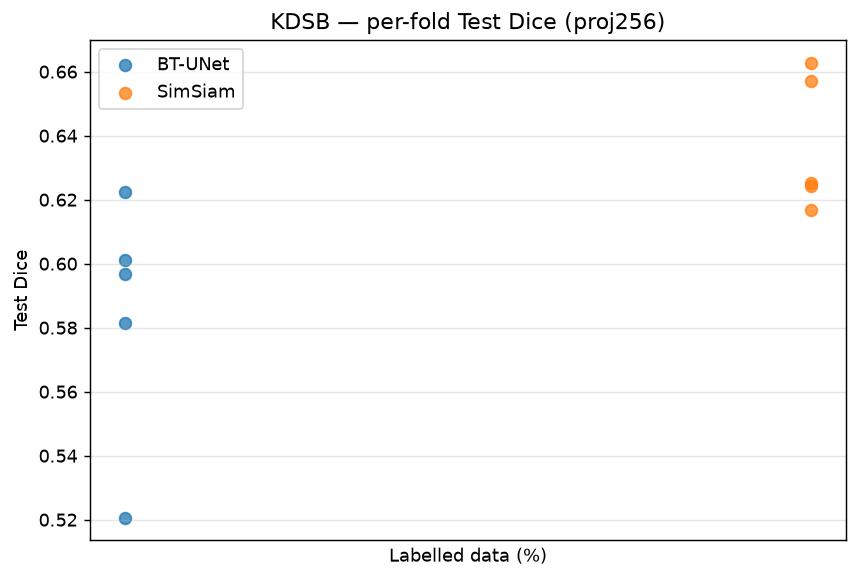

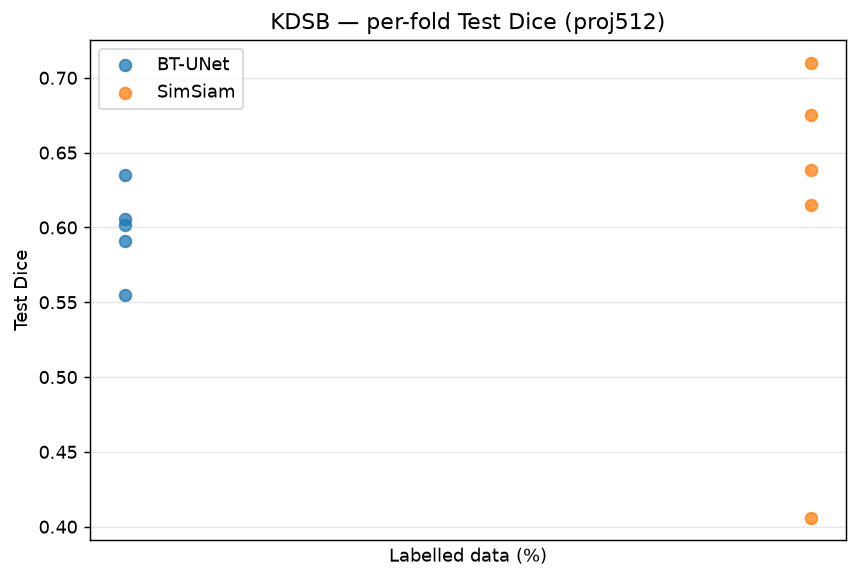

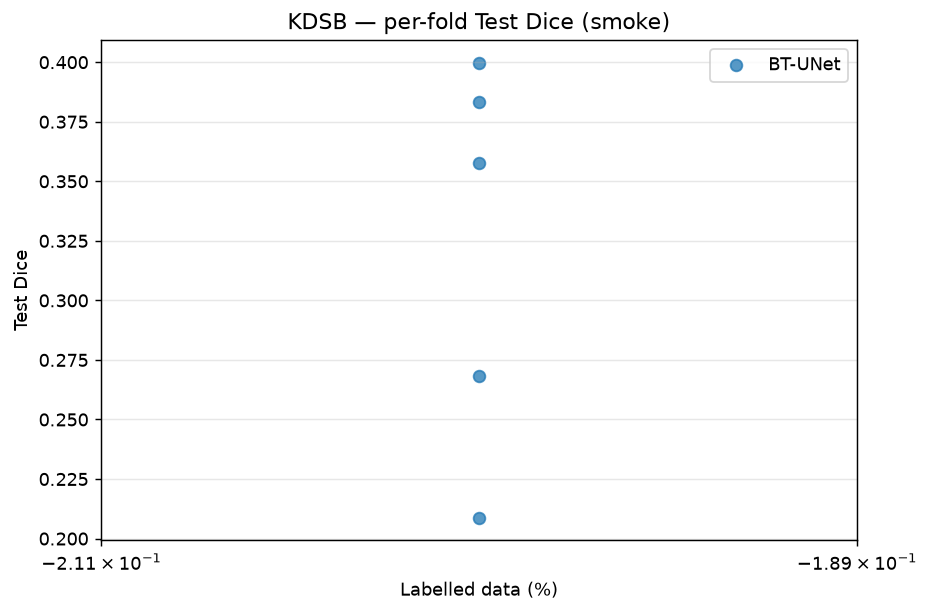

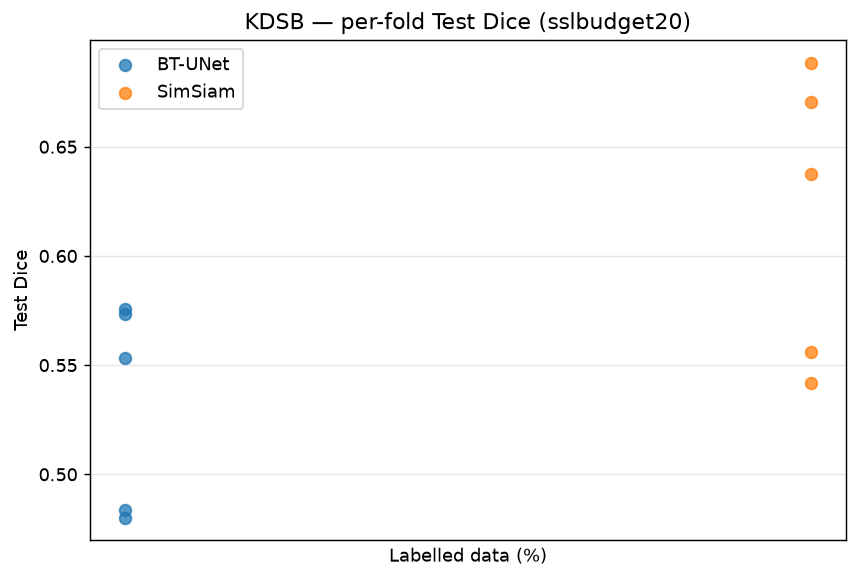

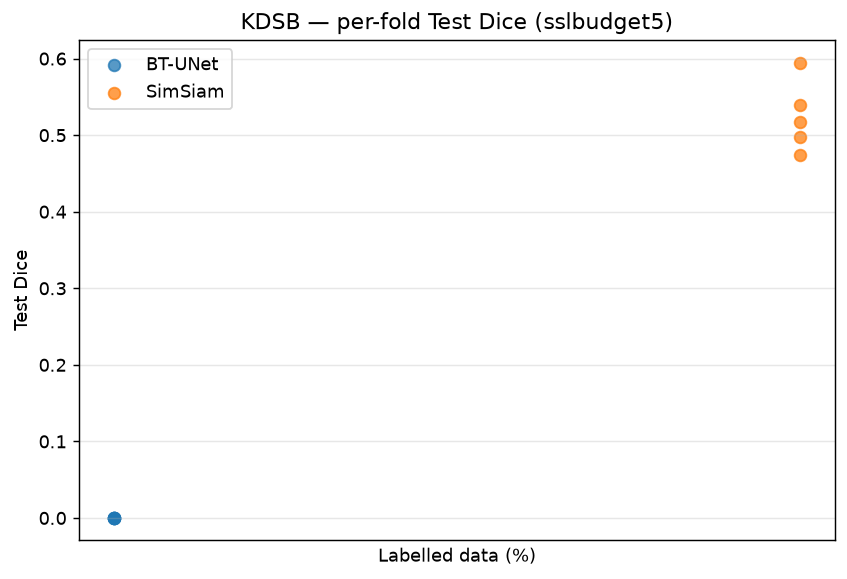

In [45]:
import pandas as pd
from IPython.display import display, Image

pd.set_option("display.max_columns", None)
pd.set_option("display.float_format", "{:.4f}".format)

headline = pd.read_csv("results/tier0/headline.csv")
display(headline)

collapse = pd.read_csv("results/tier0/collapse_rates.csv")
flagged  = collapse[collapse["collapsed"] > 0]
if not flagged.empty:
    print("\nCells where the recall floor removed folds. Any ensemble here was built")
    print("from a subset of its folds and is not comparable with a cell where none")
    print("were excluded — check Folds Combined before quoting these numbers.\n")
    display(flagged)

for p in sorted(glob.glob("results/tier0/fold_scatter_*.png")):
    display(Image(filename=p))

### Collapse or calibration?

A fold scores near zero because nothing crosses the 0.5 threshold. Two causes,
different meanings: the model learned nothing, or it learned something sitting
under the threshold. The `Diagnosis` column decides.

This one needs a GPU for prediction, but trains nothing and finishes in minutes.
Probabilities are cached, so re-running is nearly instant.

In [46]:
run("tier0_sweep.py", "--dataset", DATASET, "--gpu", GPU, "--tune-on-foldval")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/tier0_sweep.py --dataset ISIC2018 --gpu 0 --tune-on-foldval 

I0000 00:00:1787190212.480512 2917933 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded ISIC2018: {'X_train': (2594, 256, 256, 3), 'Y_train': (2594, 256, 256, 1), 'X_test': (1000, 256, 256, 3), 'Y_test': (1000, 256, 256, 1), 'X_val': (100, 256, 256, 3), 'Y_val': (100, 256, 256, 1)}
Found 290 fold model(s)
  cached  ISIC2018_BT-UNet_10pct_fold0
  cached  ISIC2018_BT-UNet_10pct_fold1
  cached  ISIC2018_BT-UNet_10pct_fold2
  cached  ISIC2018_BT-UNet_10pct_fold3
  cached  ISIC2018_BT-UNet_10pct_fold4
  predict ISIC2018_BT-UNet_10pct_frozen_fold0
I0000 00:00:178719

0

,Model,Label Fraction (%),Diagnosis,folds
0,BT-UNet,1,healthy,6
1,BT-UNet,1,threshold-sensitive,4
2,BT-UNet,5,calibration,4
3,BT-UNet,5,collapsed,5
4,BT-UNet,5,healthy,24
5,BT-UNet,5,threshold-sensitive,62
6,BT-UNet,10,healthy,7
7,BT-UNet,10,threshold-sensitive,3
8,BT-UNet,20,healthy,10
9,BT-UNet,50,healthy,5


,Model,Label Fraction (%),Fold,Prob Max,Test Dice @0.5,Best Threshold,Test Dice @best,Diagnosis
1,BT-UNet,10,1,1.0000,0.5239,0.9500,0.5668,threshold-sensitive
5,BT-UNet,10,0,0.9999,0.6272,0.6500,0.6518,threshold-sensitive
8,BT-UNet,10,3,1.0000,0.5982,0.7500,0.6380,threshold-sensitive
10,BT-UNet,1,0,1.0000,0.5350,0.9500,0.5963,threshold-sensitive
11,BT-UNet,1,1,1.0000,0.5352,0.9500,0.6163,threshold-sensitive
...,...,...,...,...,...,...,...,...
284,Baseline,5,4,0.5578,0.0495,0.3500,0.5474,calibration
285,Baseline,5,0,0.5977,0.2075,0.4000,0.5873,threshold-sensitive
286,Baseline,5,1,0.7022,0.2838,0.4000,0.4157,threshold-sensitive
287,Baseline,5,2,0.4831,0.0001,0.4000,0.5173,calibration


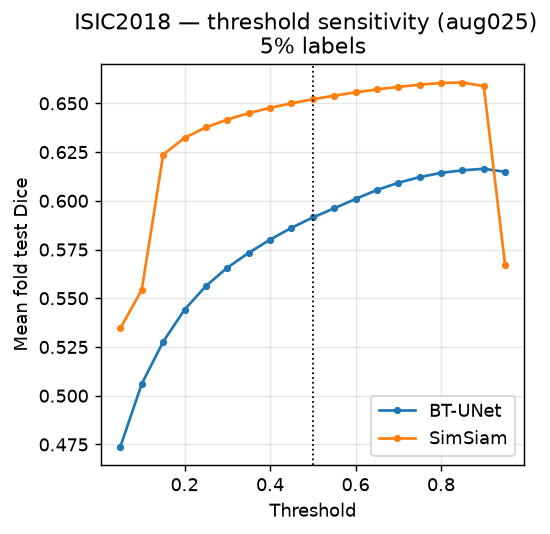

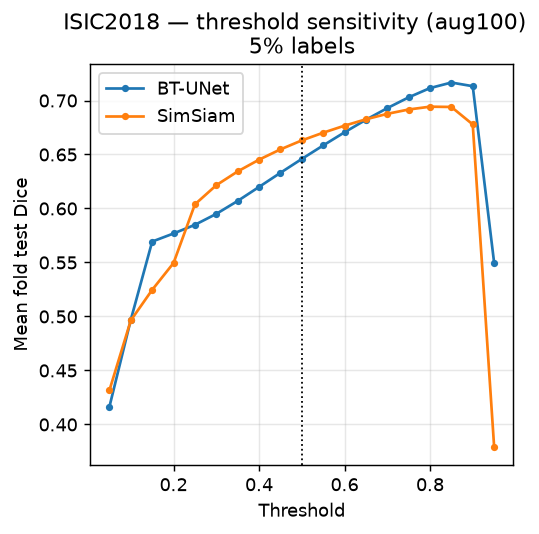

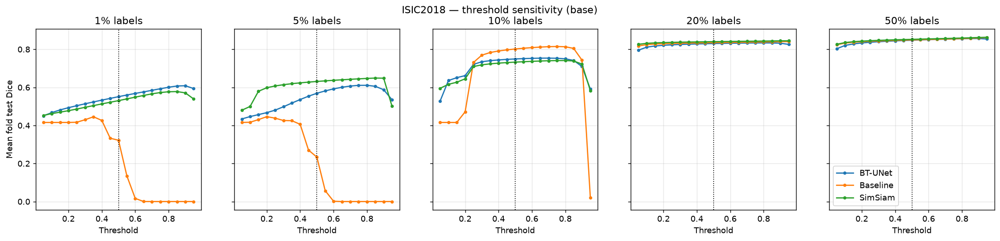

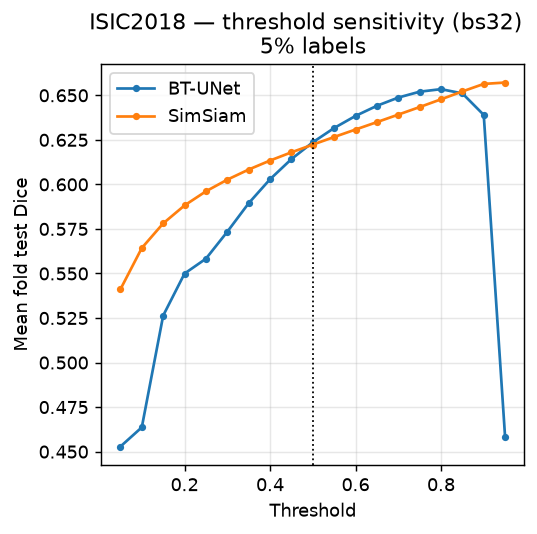

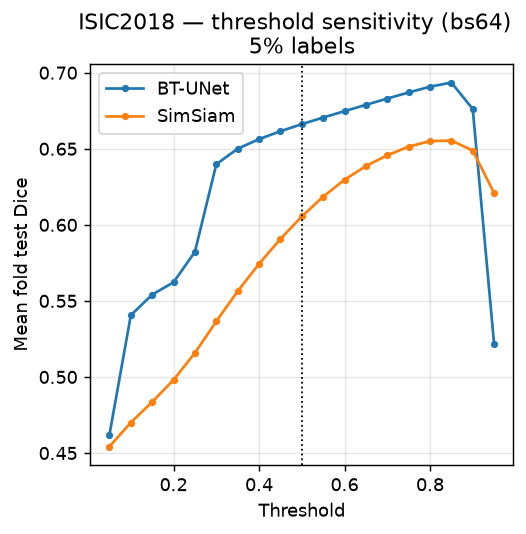

...

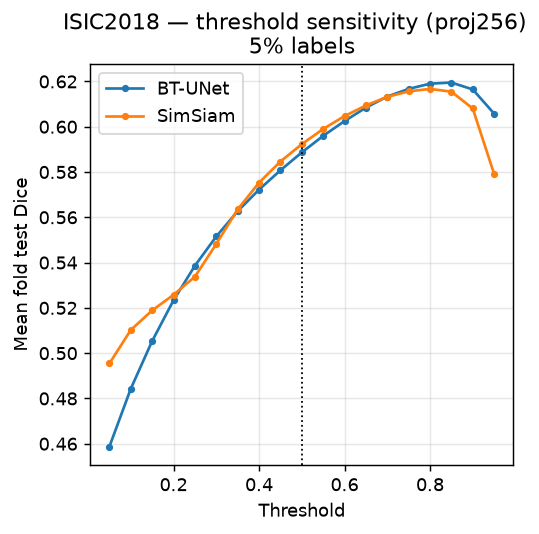

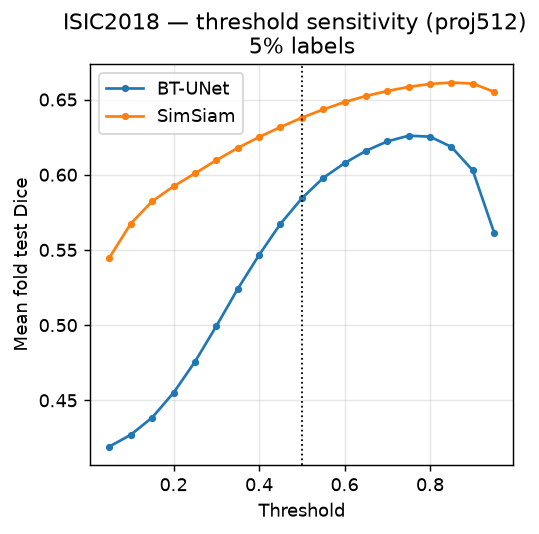

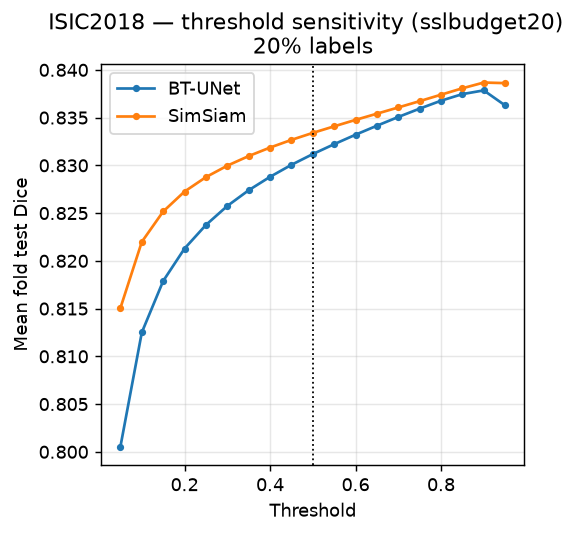

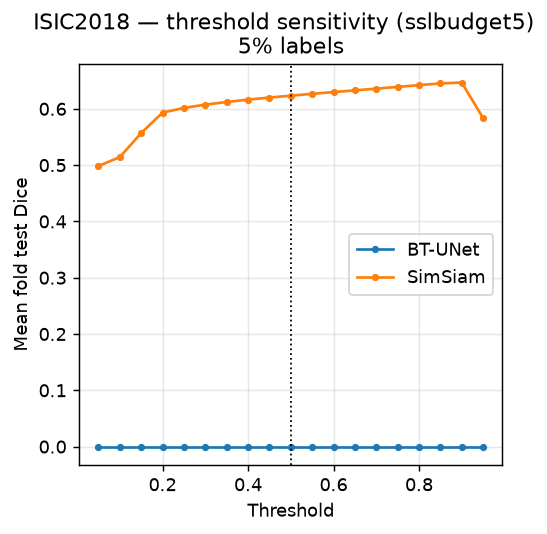

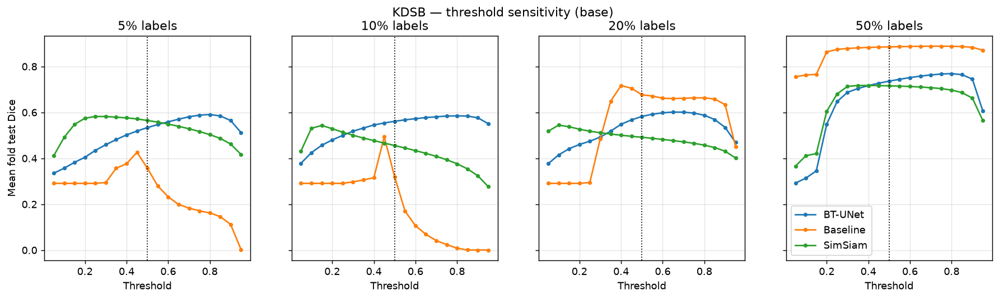

In [47]:
sweep = pd.read_csv(f"results/tier0/{DATASET}_threshold_sweep_folds.csv")
display(sweep.groupby(["Model", "Label Fraction (%)", "Diagnosis"]).size()
             .rename("folds").reset_index())

cols = ["Model", "Label Fraction (%)", "Fold", "Prob Max", "Test Dice @0.5",
        "Best Threshold", "Test Dice @best", "Diagnosis"]
display(sweep[sweep["Diagnosis"] != "healthy"][cols])

for p in sorted(glob.glob("results/tier0/threshold_sweep_*.png")):
    display(Image(filename=p))

If the diagnosis comes back `calibration` rather than `collapsed`, the headline
claim changes from "SSL prevents collapse" to "SSL produces better-calibrated
outputs at a fixed threshold", and the stages below are worth reordering around
that. Read this before starting Stage 1.

## Your existing models are reused, not overwritten

Base-variant filenames are identical to your notebooks': encoders are
`{DATASET}_barlow_twins_encoder.keras` and `{DATASET}_simsiam_encoder.keras`, fold
models are `model_{DATASET}_{FAMILY}_{pct}pct_fold{i}.keras`. So `pretrain.py`
skips encoders you already trained, and `finetune.py` finds your completed folds.

When it finds a model with no matching results row, it **adopts** it: loads it,
scores it, and writes the row, without retraining. That backfills the collapse
bookkeeping and both ensemble variants onto your existing ISIC2018 runs for the
cost of a prediction pass. It never deletes a model it did not write — a `.partial`
sentinel written before `fit` and removed after is what distinguishes its own
interrupted checkpoints from your finished ones. Pass `--retrain-foreign` if you
would rather retrain from scratch.

Only the CSVs use new names (`{DATASET}_{method}_{variant}_cv_results.csv`),
because the rows now carry Variant, Keyname, Collapsed and Prob Max columns that
your originals lack. Appending different columns to an existing CSV misaligns it
silently, so those stay separate. `tier0_tables.py` reads both.

## Smoke test

A few minutes. Exercises encoder save/load, the name-based backbone cut, the fold
loop, resume, and both ensemble paths. Worth running before a long queue.

In [27]:
run("pretrain.py", "--method", "barlow", "--dataset", DATASET, "--gpu", GPU,
    "--epochs", 1, "--variant", "smoke")

run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "barlow",
    "--encoder-variant", "smoke", "--variant", "smoke",
    "--fractions", 0.01, "--epochs", 2, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --epochs 1 --variant smoke 

I0000 00:00:1787109489.036581 2069302 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787109491.641307 2069302 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,467 params, projection dim 128
P

0

In [28]:
# Re-run the same fine-tune command. Every fold should report "Complete, skipping.",
# which is the behaviour that makes a 72-hour boundary survivable.
run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "barlow",
    "--encoder-variant", "smoke", "--variant", "smoke",
    "--fractions", 0.01, "--epochs", 2, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/finetune.py --dataset KDSB --gpu 0 --method barlow --encoder-variant smoke --variant smoke --fractions 0.01 --epochs 2 --fast-metrics 

I0000 00:00:1787109771.778392 2095879 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Encoder: saved_models/KDSB_barlow_twins_smoke_encoder.keras
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}

BT-UNet | smoke | 1% labelled | 5 folds | 5 images

--- Fold 1/5 (KDSB_BT-UNet_1pct_smoke_fold0) ---
  Complete, skipping.

--- Fold 2/5 (KDSB_BT-UNet_1pct_

0

## Stage 1 — main sweep, five fractions

~6.5 h. Adds 1%, where the SSL gap should be widest, and re-runs the existing
fractions through the new runner so everything carries collapse bookkeeping and
both ensemble variants.

Each family is its own cell. They run in sequence on the one GPU; each script
owns the card for its own process and releases it on exit, so nothing overlaps.

In [29]:
FRAC_ALL = ["0.01", "0.05", "0.10", "0.20", "0.50"]

run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--scratch",
    "--fractions", *FRAC_ALL, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/finetune.py --dataset KDSB --gpu 0 --scratch --fractions 0.01 0.05 0.10 0.20 0.50 --fast-metrics 

I0000 00:00:1787109775.642140 2096013 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}

UNet | base | 1% labelled | 5 folds | 5 images

--- Fold 1/5 (KDSB_UNet_1pct_fold0) ---
I0000 00:00:1787109778.299980 2096013 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quad

0

In [30]:
run("pretrain.py", "--method", "barlow", "--dataset", DATASET, "--gpu", GPU,
    "--variant", "base")
run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "barlow",
    "--encoder-variant", "base", "--fractions", *FRAC_ALL, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --variant base 

I0000 00:00:1787110217.370379 2223183 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787110219.874056 2223183 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,467 params, projection dim 128
Pretraining b

0

In [31]:
run("pretrain.py", "--method", "simsiam", "--dataset", DATASET, "--gpu", GPU,
    "--variant", "base")
run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "simsiam",
    "--encoder-variant", "base", "--fractions", *FRAC_ALL, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method simsiam --dataset KDSB --gpu 0 --variant base 

I0000 00:00:1787110942.976107 2392491 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787110945.461598 2392491 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,979 params, projection dim 128
Pretraining 

0

## Stage 2 — frozen encoder

~0.7 h. Separates "the SSL weights are a good representation" from "the SSL
weights are a good initialisation".

`--freeze-encoder` sets `backbone.trainable = False`, which also puts encoder
BatchNorm into inference mode for the whole run. Describe it as
**frozen encoder incl. BN**, not "frozen weights".

In [32]:
FRAC_LOW = ["0.01", "0.05", "0.10"]

for method in ["barlow", "simsiam"]:
    run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
        "--encoder-variant", "base", "--freeze-encoder", "--variant", "frozen",
        "--fractions", *FRAC_LOW, "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/finetune.py --dataset KDSB --gpu 0 --method barlow --encoder-variant base --freeze-encoder --variant frozen --fractions 0.01 0.05 0.10 --fast-metrics 

I0000 00:00:1787111666.329243 2552948 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Encoder: saved_models/KDSB_barlow_twins_base_encoder.keras
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}

BT-UNet | frozen | 1% labelled | 5 folds | 5 images

--- Fold 1/5 (KDSB_BT-UNet_1pct_frozen_fold0) ---
I0000 00:00:1787111668.947898 2552948 

## Stage 3 — pretraining length curve

~4 h. The 0-epoch point saves a randomly initialised encoder without training, so
fine-tuning from it should land on top of your from-scratch baseline. If it
doesn't, something other than the encoder weights differs between your pipelines,
and you want to know that before interpreting any gap.

`e100` is the base encoder from Stage 1 and doesn't need retraining.

In [ ]:
for epochs in [0, 25, 50, 200]:
    for method in ["barlow", "simsiam"]:
        tag = f"e{epochs}"
        run("pretrain.py", "--method", method, "--dataset", DATASET, "--gpu", GPU,
            "--epochs", epochs, "--variant", tag)
        run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
            "--encoder-variant", tag, "--variant", tag,
            "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --epochs 0 --variant e0 

I0000 00:00:1787113051.472998 3044799 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787113054.030384 3044799 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,467 params, projection dim 128
epoc

## Stage 4 — SSL data budget

~3 h. Both SSL methods currently pretrain on all 2594 training images, including
the 95% whose labels you withhold. This asks how much of the 5% gain comes from
the SSL objective and how much from seeing 20x more images.

In [34]:
for method in ["barlow", "simsiam"]:
    for pct, frac in [(5, "0.05"), (20, "0.20")]:
        tag = f"sslbudget{pct}"
        run("pretrain.py", "--method", method, "--dataset", DATASET, "--gpu", GPU,
            "--ssl-fraction", frac, "--variant", tag)
        run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
            "--encoder-variant", tag, "--variant", tag,
            "--fractions", frac, "--fast-metrics")


3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - accuracy: 0.8586 - dice_coeff: nan - loss: nan - mean_absolute_error: nan - mean_io_u: 0.4293 - precision: 0.0000e+00 - recall: 0.0000e+00  E0000 00:00:1787117753.835949 3953172 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1787117755.050870 3953172 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.

Epoch 1: val_dice_coeff improved from None to nan, saving model to saved_models/model_KDSB_BT-UNet_5pct_sslbudget5_fold0.keras

Epoch 1: finished saving model to saved_models/model_KDSB_BT-UNet_5pct_sslbudget5_fold0.keras

3/3 ━━━━━━━━━━━━━━━━━━━━ 81s 19s/step - accuracy: 0.8640 - dice_coeff: nan - loss: nan - mean_absolute_error: nan - mean_io_u: 0.4320 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_accuracy: 0.8

## Stage 5 — projector and batch (both methods), plus Barlow lambda

~10 h. `PROJECT_DIM` is `IMG_HEIGHT // 2` = 128 and `PRETRAIN_BATCH` is 8. Barlow
Twins is sensitive to both, and the reference implementation uses projectors in
the thousands with large batches. BT currently trails SimSiam at 5% on ISIC2018
(0.569 vs 0.631 fold mean), so this sweep can change the result rather than
merely characterise it. Projector width and batch size exist in both methods, so
both get swept: tuning one family and not the other would bake an advantage into
the comparison. Only lambda is Barlow-specific.

Watch VRAM on `--proj-dim 2048` and `--batch 64`; drop the batch if it OOMs.

In [35]:
for method in ["barlow", "simsiam"]:
    for proj in [256, 512, 2048]:
        tag = f"proj{proj}"
        run("pretrain.py", "--method", method, "--dataset", DATASET, "--gpu", GPU,
            "--proj-dim", proj, "--variant", tag)
        run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
            "--encoder-variant", tag, "--variant", tag,
            "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --proj-dim 256 --variant proj256 

I0000 00:00:1787119503.985572  124794 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787119506.439379  124794 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 387,947 params, projection dim

In [36]:
for method in ["barlow", "simsiam"]:
    for batch in [32, 64]:
        tag = f"bs{batch}"
        run("pretrain.py", "--method", method, "--dataset", DATASET, "--gpu", GPU,
            "--batch", batch, "--variant", tag)
        run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
            "--encoder-variant", tag, "--variant", tag,
            "--fractions", "0.05", "--fast-metrics")

# lambda is Barlow-only: it weights the off-diagonal term of the cross-correlation
# loss, which SimSiam does not have.
for lambd in ["0.001", "0.02"]:
    tag = "lambda" + lambd.replace(".", "")
    run("pretrain.py", "--method", "barlow", "--dataset", DATASET, "--gpu", GPU,
        "--lambd", lambd, "--variant", tag)
    run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "barlow",
        "--encoder-variant", tag, "--variant", tag,
        "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --batch 32 --variant bs32 

I0000 00:00:1787123368.820857  751436 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787123371.324709  751436 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,467 params, projection dim 128
Pr

## Stage 6 — SimSiam-only hyperparameters

~2 h. The predictor bottleneck is 128 → 64 → 128, a ratio of 1/2; the paper uses
1/4. The no-stop-gradient run is the collapse demonstration — pretraining loss
should dive toward -1 while downstream Dice falls apart.

In [37]:
for pred in [32, 128]:
    tag = f"pred{pred}"
    run("pretrain.py", "--method", "simsiam", "--dataset", DATASET, "--gpu", GPU,
        "--pred-dim", pred, "--variant", tag)
    run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "simsiam",
        "--encoder-variant", tag, "--variant", tag,
        "--fractions", "0.05", "--fast-metrics")

run("pretrain.py", "--method", "simsiam", "--dataset", DATASET, "--gpu", GPU,
    "--no-stopgrad", "--variant", "nostopgrad")
run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "simsiam",
    "--encoder-variant", "nostopgrad", "--variant", "nostopgrad",
    "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method simsiam --dataset KDSB --gpu 0 --pred-dim 32 --variant pred32 

I0000 00:00:1787127112.665954 1388151 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787127115.335021 1388151 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,979 params, projection dim 

0

## Stage 7 — augmentation

~4 h. You flagged the colour-jitter probability as a deliberate departure from the
reference (0.8 rather than 0.9, for consistency across methods). This measures
what that and the rest of the pipeline buy. The crop+flip-only run is also a floor
check: strip enough augmentation and SSL should degrade badly.

In [38]:
for method in ["barlow", "simsiam"]:
    for tag, extra in [("aug025",   ["--aug-strength", "0.25"]),
                       ("aug100",   ["--aug-strength", "1.0"]),
                       ("cropflip", ["--jitter-p", "0", "--no-rot90"])]:
        run("pretrain.py", "--method", method, "--dataset", DATASET, "--gpu", GPU,
            "--variant", tag, *extra)
        run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", method,
            "--encoder-variant", tag, "--variant", tag,
            "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/pretrain.py --method barlow --dataset KDSB --gpu 0 --variant aug025 --aug-strength 0.25 

I0000 00:00:1787129049.999628 1699590 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}
I0000 00:00:1787129052.537494 1699590 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory:  -> device: 0, name: Quadro RTX 6000, pci bus id: 0000:01:00.0, compute capability: 7.5
Encoder: 255,467 params, projection

## Stage 8 — loss weighting

~2 h. Your `bce_dice_loss` is 0.4 BCE + 0.6 Dice. This tests the endpoints.

In [39]:
for loss in ["dice", "bce"]:
    run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--scratch",
        "--loss", loss, "--variant", f"loss{loss}",
        "--fractions", "0.05", "--fast-metrics")
    run("finetune.py", "--dataset", DATASET, "--gpu", GPU, "--method", "barlow",
        "--encoder-variant", "base", "--loss", loss, "--variant", f"loss{loss}",
        "--fractions", "0.05", "--fast-metrics")

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/finetune.py --dataset KDSB --gpu 0 --scratch --loss dice --variant lossdice --fractions 0.05 --fast-metrics 

I0000 00:00:1787132893.388181 2332405 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
TensorFlow 2.21.0 | GPUs visible: ['/physical_device:GPU:0']
Found cached arrays, loading...
Loaded KDSB: {'X_train': (514, 256, 256, 3), 'Y_train': (514, 256, 256, 1), 'X_test': (111, 256, 256, 3), 'Y_test': (111, 256, 256, 1), 'X_val': (110, 256, 256, 3), 'Y_val': (110, 256, 256, 1)}

UNet | lossdice | 5% labelled | 5 folds | 25 images

--- Fold 1/5 (KDSB_UNet_5pct_lossdice_fold0) ---
I0000 00:00:1787132896.068385 2332405 gpu_device.cc:2043] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22781 MB memory: 

## Collate everything

In [40]:
run("tier0_tables.py", "--results-dir", "results", "--out-dir", "results/tier0")

headline = pd.read_csv("results/tier0/headline.csv")
display(headline.sort_values(["Model", "Variant", "Label Fraction (%)"]))

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/tier0_tables.py --results-dir results --out-dir results/tier0 

Dropped 105 duplicate fold rows (same key in more than one CSV).
Dropped 21 duplicate ensemble rows (same key in more than one CSV).
Wrote:
  results/tier0/fold_summary.csv
  results/tier0/headline.csv
  results/tier0/collapse_rates.csv
  results/tier0/fold_scatter_ISIC2018_aug025.png
  results/tier0/fold_scatter_ISIC2018_aug100.png
  results/tier0/fold_scatter_ISIC2018_base.png
  results/tier0/fold_scatter_ISIC2018_bs32.png
  results/tier0/fold_scatter_ISIC2018_bs64.png
  results/tier0/fold_scatter_ISIC2018_cropflip.png
  results/tier0/fold_scatter_ISIC2018_e0.png
  results/tier0/fold_scatter_ISIC2018_e200.png
  results/tier0/fold_scatter_ISIC2018_e25.png
  results/tier0/fold_scatter_ISIC2018_e50.png
  results/tier0/fold_scatter_ISIC2018_frozen.png
  results/tier0/fold_scatter_ISIC2018_lambda0001.png
  results/tier0/fold_scatter_ISIC2018_lambda002.png
  resu

,Dataset,Model,Variant,Label Fraction (%),Folds run,Fold mean Test Dice,Fold std Test Dice,Fold median Test Dice,Collapsed folds,bimodal,Ensemble Test Dice (filtered),Folds combined (filtered),Ensemble Test Dice (unfiltered),Folds combined (unfiltered)
0,ISIC2018,BT-UNet,aug025,5,5,0.5915,0.0235,0.5912,0,False,0.6090,5.0000,0.6090,5
58,KDSB,BT-UNet,aug025,5,5,0.5216,0.0532,0.5252,0,False,0.5136,5.0000,0.5136,5
1,ISIC2018,BT-UNet,aug100,5,5,0.6459,0.1470,0.5541,0,False,0.6962,5.0000,0.6962,5
59,KDSB,BT-UNet,aug100,5,5,0.5987,0.0254,0.5910,0,False,0.6030,5.0000,0.6030,5
2,ISIC2018,BT-UNet,base,1,5,0.5511,0.0217,0.5390,0,False,0.5658,5.0000,0.5658,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,KDSB,SimSiam,proj512,5,5,0.6089,0.1191,0.6384,0,False,0.7149,5.0000,0.7149,5
56,ISIC2018,SimSiam,sslbudget20,20,5,0.8334,0.0068,0.8347,0,False,0.8450,5.0000,0.8450,5
115,KDSB,SimSiam,sslbudget20,20,5,0.6189,0.0667,0.6376,0,False,0.6826,5.0000,0.6826,5
57,ISIC2018,SimSiam,sslbudget5,5,5,0.6234,0.0885,0.5962,0,False,0.6102,5.0000,0.6102,5


### Which hyperparameters actually mattered

A raw delta table subtracts fold means and shows nothing else, which makes a
variant that got one lucky fold look like the best result you have. The report
below puts each gap next to the spread it sits in.

Read the `verdict` column:

- **clear / weak** — the gap is larger than the fold-to-fold noise. Worth writing up.
- **noise** — the gap is smaller than the noise. No detectable effect, whatever the
  raw delta says.
- **(outlier-driven)** — mean and median disagree in sign, so one fold is carrying
  the whole difference. Quote the median.

`d/SE` is the gap divided by its standard error. Below 2, the difference is not
separable from noise at five folds. This is triage, not a significance test: five
folds drawn from one labelled subset cannot support one, and folds share most of
their training data so they are not independent.

In [41]:
# Ablation report: each variant vs base, with the fold-level noise beside it.
# Deduplicates rows and drops the smoke test automatically.
run("ablation_report.py", "--results-dir", "results", "--dataset", DATASET)

$ /home/kmal768/miniconda3/bin/python -u /home/kmal768/ablations/ablation_report.py --results-dir results --dataset KDSB 

Dropped 105 duplicate fold rows (same model, variant, fraction and fold in more than one CSV)


KDSB — BT-UNet
 Fraction     Variant  n  collapsed   mean  median    std  d_mean  d_median     SE    d/SE   verdict
        1      frozen  5          0 0.5281  0.5280 0.0299  0.0154    0.0087 0.0223  0.6908     noise
        1        base  5          0 0.5127  0.5193 0.0400  0.0000    0.0000    NaN     NaN reference
        5        bs64  5          0 0.6064  0.5998 0.0933  0.0728    0.0675 0.0551  1.3197     noise
        5      aug100  5          0 0.5987  0.5910 0.0254  0.0650    0.0586 0.0378  1.7201     noise
        5     proj512  5          0 0.5976  0.6019 0.0288  0.0639    0.0696 0.0383  1.6702     noise
        5      frozen  5          0 0.5874  0.5947 0.0522  0.0537    0.0624 0.0429  1.2506     noise
        5     proj256  5          0 0.5845  0.5967 0.0386  

0

In [42]:
rep = pd.read_csv(f"results/tier0/ablation_report_{DATASET}.csv")

signal = rep[rep["verdict"].str.startswith(("clear", "weak"))]
print("Variants that beat the noise floor:")
display(signal[["Model", "Fraction", "Variant", "mean", "median",
                "d_mean", "d_median", "d/SE", "verdict"]]
        if not signal.empty else "none")

print("\nCollapsed cells (these are the large effects, not the subtle ones):")
display(rep[rep["collapsed"] > 0][["Model", "Fraction", "Variant", "n",
                                   "collapsed", "mean", "median"]])

Variants that beat the noise floor:


,Model,Fraction,Variant,mean,median,d_mean,d_median,d/SE,verdict
20,BT-UNet,5,sslbudget5,0.0004,0.0004,-0.5333,-0.5320,14.7980,clear
28,SimSiam-UNET,5,e200,0.6633,0.6601,0.0985,0.0888,3.2051,clear
29,SimSiam-UNET,5,proj2048,0.6611,0.6736,0.0962,0.1023,3.1075,clear
30,SimSiam-UNET,5,e25,0.6608,0.6432,0.0959,0.0720,2.7402,weak
31,SimSiam-UNET,5,pred128,0.6444,0.6535,0.0795,0.0822,2.5939,weak
33,SimSiam-UNET,5,proj256,0.6372,0.6253,0.0723,0.0541,2.3734,weak
34,SimSiam-UNET,5,frozen,0.6350,0.6531,0.0701,0.0819,2.2097,weak
45,SimSiam-UNET,5,e0,0.2873,0.2908,-0.2776,-0.2804,3.1597,clear
46,SimSiam-UNET,10,frozen,0.6225,0.6202,0.1668,0.1333,4.2706,clear
48,SimSiam-UNET,20,sslbudget20,0.6189,0.6376,0.1272,0.1190,3.5909,clear



Collapsed cells (these are the large effects, not the subtle ones):


,Model,Fraction,Variant,n,collapsed,mean,median
20,BT-UNet,5,sslbudget5,5,5,0.0004,0.0004
45,SimSiam-UNET,5,e0,5,1,0.2873,0.2908
51,UNet,1,base,5,1,0.2627,0.2936
53,UNet,5,base,5,1,0.3571,0.3011
55,UNet,10,base,5,1,0.3207,0.3798


## Housekeeping

**A cell is stuck or you need the GPU back.** Interrupt the kernel. The `run`
helper terminates the child process and returns; VRAM is released when it exits.
Re-run the cell to resume from the last completed fold.

**Check what is holding the GPU.**
```python
!nvidia-smi
```
Any TensorFlow process listed here that is not your current run is an idle kernel.
Restart that kernel rather than waiting.

**Booking about to expire.** Nothing to do. Fold models and CSV rows are on disk
as of the last completed fold. Re-run the same cells in your next window.

**Disk.** Cached test probabilities land in `saved_np/test_probs/`, roughly 130 MB
per fold at 1000 test images. Pass `--no-save-probs` if that gets tight, at the
cost of needing a GPU again for any future threshold sweep.